In [1]:
import scirpy as ir
import scanpy as sc
from glob import glob
import pandas as pd
import tarfile
import anndata
import warnings
import scanpy as sc
import anndata as an
import pandas as pd
import numpy as np
import matplotlib as mpl
import matplotlib.pyplot as plt
import seaborn as sns
import math

# Standard QC function

In [2]:
DUPa_biopsy = pd.read_csv('gs://fc-e9295d8f-5730-4967-b1ce-22c3d775d7c2/DUPa_ChromISH_CXCL10/DUPa03/DUPa03_06_analysis.csv', sep = ',')

In [3]:
def qc_true_cells(df):
    true_ccl19 = (
        ((df['CCL19 Positive Cytoplasm'] == 1) & (df['CXCL10 Positive Cytoplasm'] == 0) & (df['Rejection Positive Cytoplasm'] == 0)) |
        ((df['CCL19 Positive Nucleus'] == 1) & (df['CXCL10 Positive Nucleus'] == 0) & (df['Rejection Positive Nucleus'] == 0))
    )

    true_cxcl10 = (
        ((df['CCL19 Positive Cytoplasm'] == 0) & (df['CXCL10 Positive Cytoplasm'] == 1) & (df['Rejection Positive Cytoplasm'] == 0)) |
        ((df['CCL19 Positive Nucleus'] == 0) & (df['CXCL10 Positive Nucleus'] == 1) & (df['Rejection Positive Nucleus'] == 0))
    )

    true_neither = (
        (df['CCL19 Positive Cytoplasm'] == 0) &
        (df['CXCL10 Positive Cytoplasm'] == 0) &
        (df['CCL19 Positive Nucleus'] == 0) &
        (df['CXCL10 Positive Nucleus'] == 0) &
        (df['Rejection Positive Cytoplasm'] == 0) &
        (df['Rejection Positive Nucleus'] == 0)
    )

    # Combine accepted categories
    all_cells = true_ccl19 | true_cxcl10 | true_neither

    # Add QC step: exclude any row with Rejection Positive in nucleus or cytoplasm
    rejection_cells = (df['Rejection Positive Cytoplasm'] == 0) & (df['Rejection Positive Nucleus'] == 0)

    # Combine both masks
    final_cells = all_cells & rejection_cells
    df_filtered = df[final_cells].copy()

    # Add indicator columns
    df_filtered['True_CCL19'] = true_ccl19[final_cells].astype(int)
    df_filtered['True_CXCL10'] = true_cxcl10[final_cells].astype(int)
    df_filtered['True_Neither'] = true_neither[final_cells].astype(int)

    return df_filtered

In [4]:
print(len(DUPa_biopsy))
DUPa_biopsy_post_QC = qc_true_cells(DUPa_biopsy)
print(len(DUPa_biopsy_post_QC))

733227
731307


# Simple counting number of cells that are CXCL10+ or CCL19+ 

In [5]:
# count CXCL10+ cells, CCL19+ cells. calculate percentages
cxcl10_count = (DUPa_biopsy_post_QC['True_CXCL10'] == 1).sum()
ccl19_count = (DUPa_biopsy_post_QC['True_CCL19'] == 1).sum()
print('CXCL10+: '+ str(cxcl10_count) + ', CCL19+: ' + str(ccl19_count))
print('CXCL10+ percentage: ' + str(100*cxcl10_count/len(DUPa_biopsy_post_QC)))
print('CCL19+ percentage: ' + str(100*ccl19_count/len(DUPa_biopsy_post_QC)))


CXCL10+: 45380, CCL19+: 4339
CXCL10+ percentage: 6.205328268428991
CCL19+ percentage: 0.5933212727349799


# Hexagon Tiling Analysis: (PMID: 38503922)

In [6]:
from matplotlib.patches import RegularPolygon
from scipy.spatial import cKDTree
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

# Creates hexagon tiles of area 2500 microns across grid. Saves hexagon grid image as DUPa_Tile_Grid.
def plot_hex_tiling(df, area=2500, save_path='DUPa_Tile_Grid.pdf'):
    
    # Center of cell is average of min and max. Then, convert from pixels to microns (4:1 ratio).
    df['center_x'] = ((df['XMin'] + df['XMax']) / 2) * 0.25 
    df['center_y'] = ((df['YMin'] + df['YMax']) / 2) * 0.25
    x = df['center_x'].values
    y = df['center_y'].values
    CXCL1011_positive = (df['True_CXCL10'] == 1).astype(int).values
    CCL19_positive = (df['True_CCL19'] == 1).astype(int).values

    # Hex radius from area of hexagon
    r = np.sqrt((2 * area) / (3 * np.sqrt(3))) 
    pad = 3 * r
    x_min, x_max = x.min() - pad, x.max() + pad
    y_min, y_max = y.min() - pad, y.max() + pad

    # Sets the number of tiles per column and row.
    hex_width = np.sqrt(3) * r
    hex_height = 2 * r
    cols = int((x_max - x_min) / hex_width) + 2
    rows = int((y_max - y_min) / (hex_height * 0.75)) + 2

    # Places tiles in the grid, appending coordinates of each center to list hex_centers.
    hex_centers = []
    for row in range(rows):
        for col in range(cols):
            x_offset = x_min + col * hex_width
            if row % 2 == 1:
                x_offset += hex_width / 2
            y_offset = y_min + row * hex_height * 0.75
            if x_offset <= x_max and y_offset <= y_max:
                hex_centers.append((x_offset, y_offset))
    
    # Build spatial index to assign cells to closest hex center
    tree = cKDTree(hex_centers)
    distances, indices = tree.query(np.vstack([x, y]).T)

    # Count cells per tile & marker-positive cells
    tile_counts = {}
    tile_CXCL1011_counts = {}
    tile_CCL19_counts = {}
    for idx, CXCL1011, CCL19 in zip(indices, CXCL1011_positive, CCL19_positive):
        tile_counts[idx] = tile_counts.get(idx, 0) + 1
        tile_CXCL1011_counts[idx] = tile_CXCL1011_counts.get(idx, 0) + CXCL1011
        tile_CCL19_counts[idx] = tile_CCL19_counts.get(idx, 0) + CCL19

    # Plot tiles with colors according to cell counts
    fig, ax = plt.subplots(figsize=(8, 8), dpi=300)
    for i, (hx, hy) in enumerate(hex_centers):
        CXCL1011 = tile_CXCL1011_counts.get(i, 0)
        CCL19 = tile_CCL19_counts.get(i, 0)
        count = tile_counts.get(i, 0)
        if count == 0: 
            facecolor = '#F0F0F0'  # No cells in tile.
        elif CXCL1011 > 1 and CCL19 > 0:
            facecolor = '#832121'      # At least 2 CXCL10/11+ and at least 1 CCL19+ cells in tile.
        elif CXCL1011 > 1 and CCL19 == 0:
            facecolor = '#FF9999'     # At least 2 CXCL10/11+ and 0 CCL19+ cells in tile.
        elif CCL19 > 0 and CXCL1011 == 0:
            facecolor = '#CC9966'    # 0 CXCL10/11+ cells and at least 1 CCL19+ cell in tile.
        else:
            facecolor = '#0000FF'     # At least 1 cell but 0 CXCL10/11+ or CCL19+.

        hex_patch = RegularPolygon(
            (hx, hy), numVertices=6, radius=r, orientation=0,
            facecolor=facecolor, edgecolor='k', linewidth=0.2
        )
        ax.add_patch(hex_patch)

    # Print tile statistics
    total_tiles = len(hex_centers)
    tiles_with_cells = len(tile_counts)
    tiles_with_both = sum(1 for i in tile_counts if tile_CXCL1011_counts.get(i, 0) > 1 and tile_CCL19_counts.get(i, 0) > 0)
    tiles_CXCL1011_only = sum(1 for i in tile_counts if tile_CXCL1011_counts.get(i, 0) > 1 and tile_CCL19_counts.get(i, 0) == 0)
    tiles_CCL19_only = sum(1 for i in tile_counts if tile_CCL19_counts.get(i, 0) > 0 and tile_CXCL1011_counts.get(i, 0) == 0)
    print(f"Total tiles: {total_tiles}")
    print(f"Tiles with cells: {tiles_with_cells}")
    print(f"Tiles with CXCL10/11 only: {tiles_CXCL1011_only}")
    print(f"Tiles with CCL19 only: {tiles_CCL19_only}")
    print(f"Tiles with both markers: {tiles_with_both}")

    # Finalize plot
    ax.set_aspect('equal')
    ax.set_xlim(x_min, x_max)
    ax.set_ylim(y_min, y_max)
    ax.invert_yaxis()
    ax.set_xlabel("X (μm)")
    ax.set_ylabel("Y (μm)")
    ax.set_title("Hex Tiling (2500 μm²)\nRed=2+ CXCL10/11+ & 1+ CCL19+, Pink=2+ CXCL10/11+ only, Brown=1+ CCL19+ only, Blue=Others, Gray=Empty")
    plt.savefig(save_path, dpi=300, bbox_inches='tight')
    plt.show()

    # Save vertex coordinates for ALL tile in grid to CSV
    hex_data = []
    for i in tile_counts:
        hx, hy = hex_centers[i]
        angles = np.deg2rad(np.arange(6) * 60 + 30)  # Vertices of hexagon tile : 30, 90, 150, 210, 270, 330 degrees
        angles = np.append(angles, angles[0])  # Close the tile by returning to first vertex
        for j, angle in enumerate(angles):
            vx = hx + r * np.cos(angle) 
            vy = hy + r * np.sin(angle)
            hex_data.append({
                'hex_index': i,
                'center_x': hx*4,
                'center_y': hy*4,
                'vertex_num': j + 1,
                'vertex_x': vx*4,
                'vertex_y': vy*4
            })

    hex_df = pd.DataFrame(hex_data)
    hex_df.to_csv("tiles_with_cells_vertices.csv", index=False)

    return hex_centers, tile_CXCL1011_counts, tile_CCL19_counts, tile_counts, r


Total tiles: 77824
Tiles with cells: 51822
Tiles with CXCL10/11 only: 9004
Tiles with CCL19 only: 1297
Tiles with both markers: 773


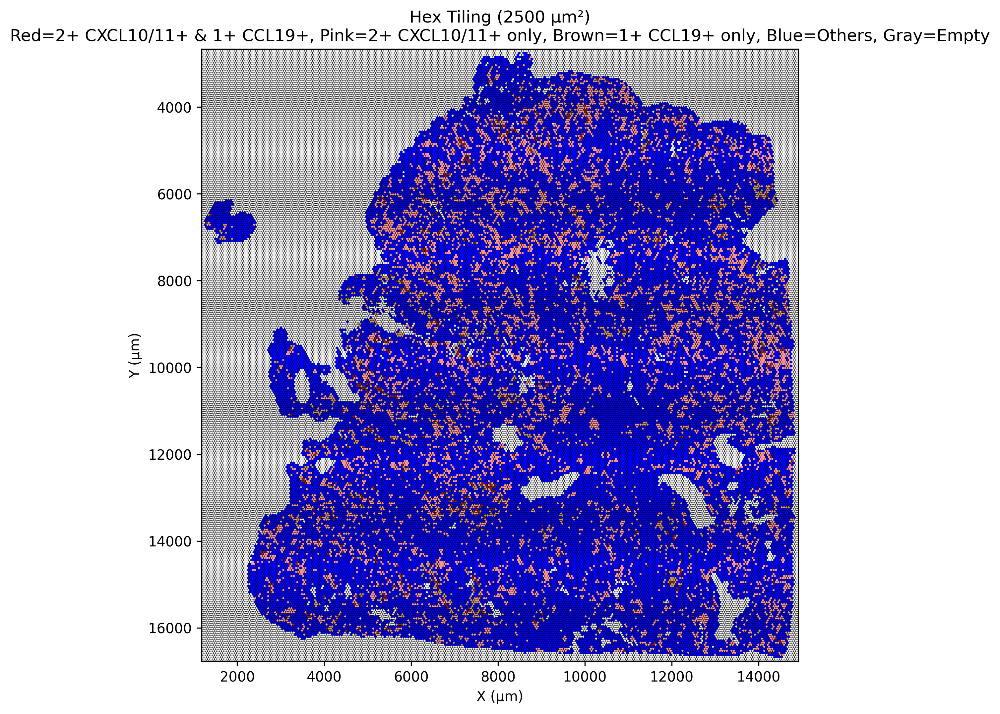

In [7]:
## Run plot and get tile data
hex_centers, tile_CXCL1011_counts, tile_CCL19_counts, tile_counts, r = plot_hex_tiling(DUPa_biopsy_post_QC)

In [8]:
# Run in terminal (sends DUPa_Tile_Grid to Google Cloud):
# gsutil mv Alex_Tang_workspace_2023_02_01/edit/DUPa_Tile_Grid.pdf  gs://fc-e9295d8f-5730-4967-b1ce-22c3d775d7c2/DUPa_ChromISH_CXCL10/DUPa_Overlay_Files/DUPa07_04_Tile_Grid.pdf
# Change name of destination path for specific DUPa

# Hexagon Tile Analysis Overlay (QuPath)

In [8]:
# Run in terminal (sends tiles_with_cells_vertices to Google Cloud): 
# gsutil -m cp -r Alex_Tang_workspace_2023_02_01/edit/tiles_with_cells_vertices.csv  gs://fc-e9295d8f-5730-4967-b1ce-22c3d775d7c2/DUPa_ChromISH_CXCL10


In [10]:
# Loads in tiles_with_cells_vertices from Google Cloud.
original_coordinates = pd.read_csv("gs://fc-e9295d8f-5730-4967-b1ce-22c3d775d7c2/DUPa_ChromISH_CXCL10/tiles_with_cells_vertices.csv", sep = ',')
print(original_coordinates)

        hex_index      center_x      center_y  vertex_num      vertex_x  \
0            1146  30943.764393  11400.741944           1  31051.221386   
1            1146  30943.764393  11400.741944           2  30943.764393   
2            1146  30943.764393  11400.741944           3  30836.307400   
3            1146  30943.764393  11400.741944           4  30836.307400   
4            1146  30943.764393  11400.741944           5  30943.764393   
...           ...           ...           ...         ...           ...   
362749      77304  58130.383668  66678.670574           3  58022.926675   
362750      77304  58130.383668  66678.670574           4  58022.926675   
362751      77304  58130.383668  66678.670574           5  58130.383668   
362752      77304  58130.383668  66678.670574           6  58237.840661   
362753      77304  58130.383668  66678.670574           7  58237.840661   

            vertex_y  
0       11462.782268  
1       11524.822592  
2       11462.782268  
3      

In [11]:
# QuPath needs geojson format.
import pandas as pd
import json

def convert_csv_to_geojson(csv_path="original_coordinates.csv", output_path="output_annotations.geojson"):
    # Read CSV and identify coordinate and group columns
    df = pd.read_csv(csv_path)
    x_col = df.columns[-2]
    y_col = df.columns[-1]
    group_col = df.columns[0]

    # Group by polygon ID
    grouped = df.groupby(group_col)

    # Build GeoJSON structure
    geojson = {
        "type": "FeatureCollection",
        "features": []
    }

    for region_id, group in grouped:
        # Build the polygon vertex list
        polygon = [
            [float(row[x_col]), float(row[y_col])]
            for _, row in group.iterrows()
        ]

        # Ensure the polygon is closed
        if polygon[0] != polygon[-1]:
            polygon.append(polygon[0])

        feature = {
            "type": "Feature",
            "properties": {
                "region_id": int(region_id)
            },
            "geometry": {
                "type": "Polygon",
                "coordinates": [polygon]  # GeoJSON requires coordinates in [ [ [x, y], ... ] ] format
            }
        }

        geojson["features"].append(feature)

    # Save to GeoJSON file
    with open(output_path, "w", encoding="utf-8") as f:
        json.dump(geojson, f, indent=2)

    print(f"Saved GeoJSON to {output_path}")


In [13]:
# Convert the csv file to geojson.
convert_csv_to_geojson("gs://fc-e9295d8f-5730-4967-b1ce-22c3d775d7c2/DUPa_ChromISH_CXCL10/tiles_with_cells_vertices.csv", "DUPa03_06_hexagons.geojson")
# Note: Make sure to change name of output_path for specific DUPa.

Saved GeoJSON to DUPa03_06_hexagons.geojson


In [14]:
# Run in terminal (sends hexagon tile file to Google Cloud for download to local device):
# gsutil -m cp -r Alex_Tang_workspace_2023_02_01/edit/DUPa03_06_hexagons.geojson gs://fc-e9295d8f-5730-4967-b1ce-22c3d775d7c2/DUPa_ChromISH_CXCL10/DUPa_Overlay_Files
# Note: Make sure to change name of file for specific DUPa.

In [194]:

def plot_hex_tile_cell_counts_bar(df, area=2500, save_path='tile_cell_counts_bar.pdf'):
    """
    Computes hex tiling and plots a bar graph of # of cells per hex tile.
    """
    df['center_x'] = ((df['XMin'] + df['XMax']) / 2) * 0.25
    df['center_y'] = ((df['YMin'] + df['YMax']) / 2) * 0.25
    # defines the center of each cell

    x = df['center_x'].values
    y = df['center_y'].values

    r = np.sqrt((2 * area) / (3 * np.sqrt(3)))
    pad = 3 * r
    x_min, x_max = x.min() - pad, x.max() + pad
    y_min, y_max = y.min() - pad, y.max() + pad

    hex_width = np.sqrt(3) * r
    hex_height = 2 * r
    cols = int((x_max - x_min) / hex_width) + 2
    rows = int((y_max - y_min) / (hex_height * 0.75)) + 2

    hex_centers = []
    for row in range(rows):
        for col in range(cols):
            x_offset = x_min + col * hex_width
            if row % 2 == 1:
                x_offset += hex_width / 2
            y_offset = y_min + row * hex_height * 0.75
            if x_offset <= x_max and y_offset <= y_max:
                hex_centers.append((x_offset, y_offset))

    tree = cKDTree(hex_centers)
    distances, indices = tree.query(np.vstack([x, y]).T)

    # Count number of cells per tile
    tile_counts = {}
    for idx in indices:
        tile_counts[idx] = tile_counts.get(idx, 0) + 1

    # Convert to list of counts
    counts = list(tile_counts.values())

    # Plot bar chart: how many tiles have X cells
    from collections import Counter
    count_distribution = Counter(counts)
    max_cells = max(count_distribution.keys())

    x_vals = list(range(1, max_cells + 1))
    y_vals = [count_distribution.get(k, 0) for k in x_vals]

    plt.figure(figsize=(8, 5), dpi=300)
    plt.bar(x_vals, y_vals, color='steelblue', edgecolor='black')
    plt.xlabel('# of Cells in Hex Tile')
    plt.ylabel('# of Tiles')
    plt.title('Distribution of Cell Counts per Hex Tile')
    plt.xticks(x_vals)
    plt.tight_layout()
    plt.savefig(save_path, dpi=300)
    plt.show()

    return count_distribution


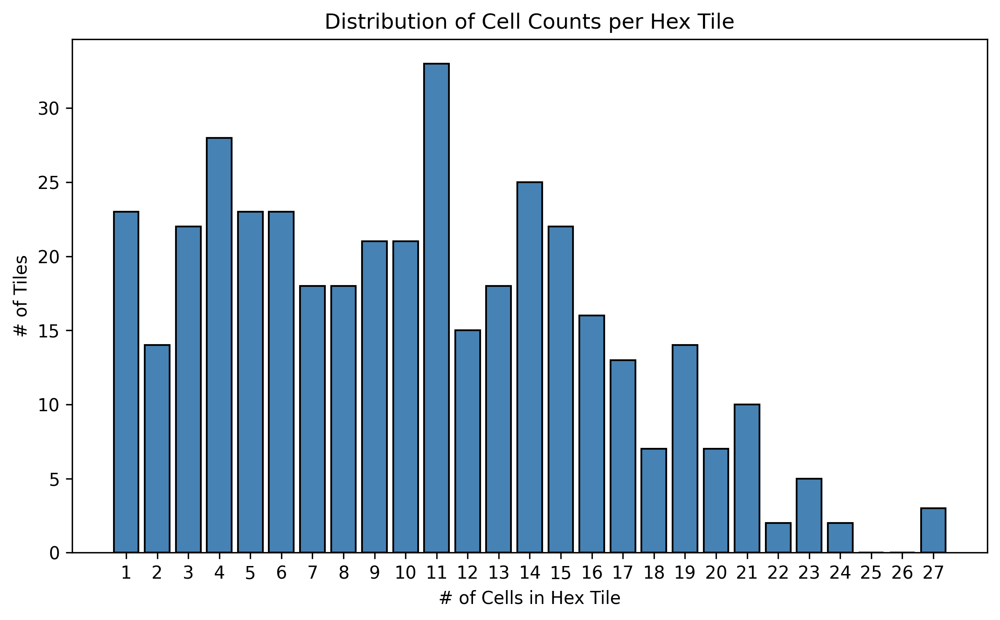

Counter({11: 33,
         4: 28,
         14: 25,
         5: 23,
         1: 23,
         6: 23,
         3: 22,
         15: 22,
         10: 21,
         9: 21,
         8: 18,
         7: 18,
         13: 18,
         16: 16,
         12: 15,
         2: 14,
         19: 14,
         17: 13,
         21: 10,
         18: 7,
         20: 7,
         23: 5,
         27: 3,
         22: 2,
         24: 2})

In [195]:
plot_hex_tile_cell_counts_bar(DUPa_biopsy_post_QC)

# plot_hex_tile_stem_immunity_hub_counts_bar

In [149]:
import numpy as np
import matplotlib.pyplot as plt
from collections import Counter
from scipy.spatial import cKDTree

def plot_hex_tile_stem_immunity_hub_counts_bar(df, area=2500, save_path='stem_immunity_hub_tile_counts_bar.pdf'):
    """
    Computes hex tiling and plots a bar graph of # of cells per hex tile,
    only for tiles that are stem-immunity hub positive (contain at least
    one CXCL10+ and one CCL19+ cell).
    """
    # Calculate cell centers
    df['center_x'] = ((df['XMin'] + df['XMax']) / 2) * 0.25
    df['center_y'] = ((df['YMin'] + df['YMax']) / 2) * 0.25
    x = df['center_x'].values
    y = df['center_y'].values

    # Setup hex grid
    r = np.sqrt((2 * area) / (3 * np.sqrt(3)))
    pad = 3 * r
    x_min, x_max = x.min() - pad, x.max() + pad
    y_min, y_max = y.min() - pad, y.max() + pad

    hex_width = np.sqrt(3) * r
    hex_height = 2 * r
    cols = int((x_max - x_min) / hex_width) + 2
    rows = int((y_max - y_min) / (hex_height * 0.75)) + 2

    # Compute hex centers
    hex_centers = []
    for row in range(rows):
        for col in range(cols):
            x_offset = x_min + col * hex_width
            if row % 2 == 1:
                x_offset += hex_width / 2
            y_offset = y_min + row * hex_height * 0.75
            if x_offset <= x_max and y_offset <= y_max:
                hex_centers.append((x_offset, y_offset))

    # Assign cells to tiles
    tree = cKDTree(hex_centers)
    distances, indices = tree.query(np.vstack([x, y]).T)

    # Get marker status
    cxcl10_positive = (df['True_CXCL10'] == 1).astype(int).values
    ccl19_positive = (df['True_CCL19'] == 1).astype(int).values

    # Build tile data
    tile_data = {}
    for i, tile_idx in enumerate(indices):
        if tile_idx not in tile_data:
            tile_data[tile_idx] = {'cxcl10': 0, 'ccl19': 0, 'count': 0}
        tile_data[tile_idx]['cxcl10'] += cxcl10_positive[i]
        tile_data[tile_idx]['ccl19'] += ccl19_positive[i]
        tile_data[tile_idx]['count'] += 1

    # Filter for stem-immunity hub positive tiles
    hub_tile_counts = [
        data['count']
        for data in tile_data.values()
        if data['cxcl10'] > 1 and data['ccl19'] > 1
    ]

    # Plot bar chart
    count_distribution = Counter(hub_tile_counts)
    if not count_distribution:
        print("No stem-immunity hub positive tiles found.")
        return {}

    max_cells = max(count_distribution.keys())
    x_vals = list(range(1, max_cells + 1))
    y_vals = [count_distribution.get(k, 0) for k in x_vals]

    plt.figure(figsize=(8, 5), dpi=300)
    plt.bar(x_vals, y_vals, color='tomato', edgecolor='black')
    plt.xlabel('# of Cells in Stem-Immunity Hub Tile')
    plt.ylabel('# of Tiles')
    plt.title('Cell Counts in Stem-Immunity Hub Positive Hex Tiles')
    plt.xticks(x_vals)
    plt.tight_layout()
    plt.savefig(save_path, dpi=300)
    plt.show()

    return count_distribution


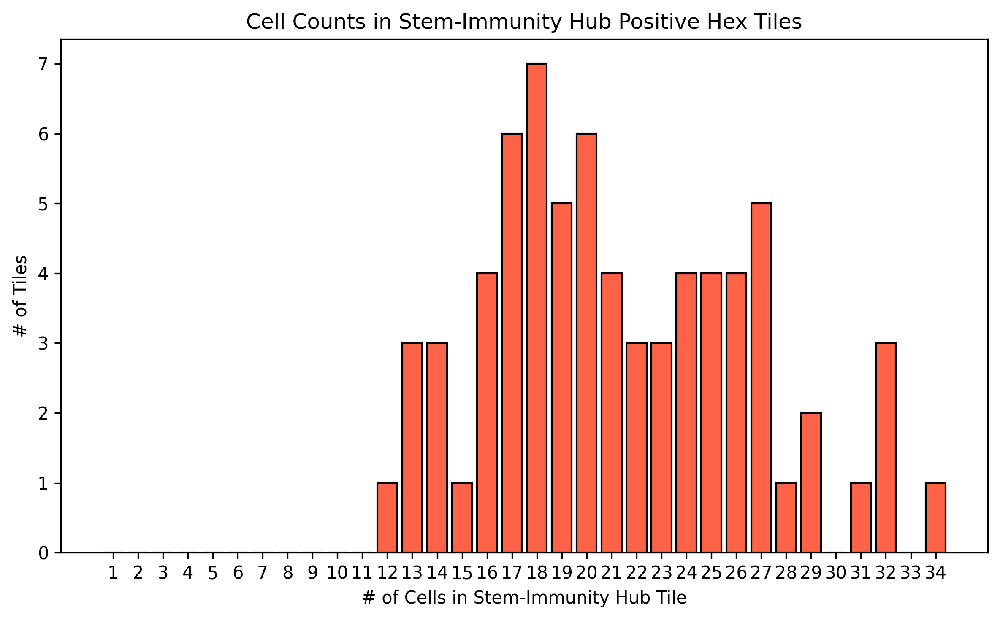

Counter({18: 7,
         17: 6,
         20: 6,
         19: 5,
         27: 5,
         24: 4,
         26: 4,
         16: 4,
         21: 4,
         25: 4,
         23: 3,
         32: 3,
         13: 3,
         22: 3,
         14: 3,
         29: 2,
         31: 1,
         34: 1,
         15: 1,
         28: 1,
         12: 1})

In [150]:
plot_hex_tile_stem_immunity_hub_counts_bar(DUPa_biopsy_post_QC)

In [137]:
count = DUPa_biopsy_post_QC.loc[DUPa_biopsy_post_QC['Rejection Positive'] == 1].shape[0]
print(count)


567


In [8]:
def analyze_tile_neighbors(hex_centers, tile_cxcl10_counts, tile_ccl19_counts, tile_counts, r, category='red'):
    total_with_cells = len(tile_counts)

    if category == 'red':
        indices = [
            i for i in tile_counts
            if tile_cxcl10_counts.get(i, 0) > 0 and tile_ccl19_counts.get(i, 0) > 0
        ]
        is_target = lambda i: tile_cxcl10_counts.get(i, 0) > 0 and tile_ccl19_counts.get(i, 0) > 0
        label = 'Red (CXCL10+ & CCL19+)'
        color = 'red'
    elif category == 'pink':
        indices = [
            i for i in tile_counts
            if tile_cxcl10_counts.get(i, 0) > 0 and tile_ccl19_counts.get(i, 0) == 0
        ]
        is_target = lambda i: tile_cxcl10_counts.get(i, 0) > 0 and tile_ccl19_counts.get(i, 0) == 0
        label = 'Pink (CXCL10+ only)'
        color = 'pink'
    elif category == 'brown':
        indices = [
            i for i in tile_counts
            if tile_ccl19_counts.get(i, 0) > 0 and tile_cxcl10_counts.get(i, 0) == 0
        ]
        is_target = lambda i: tile_ccl19_counts.get(i, 0) > 0 and tile_cxcl10_counts.get(i, 0) == 0
        label = 'Brown (CCL19+ only)'
        color = 'saddlebrown'
    else:
        raise ValueError("Invalid category")

    count_tiles = len(indices)
    fraction = count_tiles / total_with_cells if total_with_cells > 0 else 0

    print(f"\n{label} tiles: {count_tiles} / {total_with_cells} "
          f"({fraction:.2%} of tiles with at least one cell)")

    # Neighbor count analysis
    tree = cKDTree(hex_centers)
    neighbor_counts = []

    for idx in indices:
        center = hex_centers[idx]
        neighbors = tree.query_ball_point(center, r * 2)
        neighbors = [n for n in neighbors if n != idx]
        count = sum(is_target(n) for n in neighbors)
        neighbor_counts.append(count)

    # Histogram data
    hist_bins = np.arange(0, 7)
    hist_counts = np.bincount(neighbor_counts, minlength=7)

    # Weighted average calculation
    total_weight = sum(hist_counts)
    weighted_average = sum(n * c for n, c in enumerate(hist_counts)) / total_weight if total_weight > 0 else 0
    print(f"Weighted average number of similar neighbors: {weighted_average:.2f}")

    # Plot
    plt.figure(figsize=(6, 4), dpi=150)
    plt.hist(neighbor_counts, bins=np.arange(-0.5, 7.5, 1), color=color, edgecolor='black')
    plt.title(f"Number of Neighbors per {label} Tile\n(Weighted Avg = {weighted_average:.2f})")
    plt.xlabel("Number of Similar Neighbors (max 6)")
    plt.ylabel("Count")
    plt.xticks(range(7))
    plt.grid(True, linestyle='--', alpha=0.6)
    plt.tight_layout()
    plt.savefig(f"{category}_tile_neighbor_histogram.pdf", bbox_inches="tight")
    plt.show()



Red (CXCL10+ & CCL19+) tiles: 185 / 29383 (0.63% of tiles with at least one cell)
Weighted average number of similar neighbors: 0.50


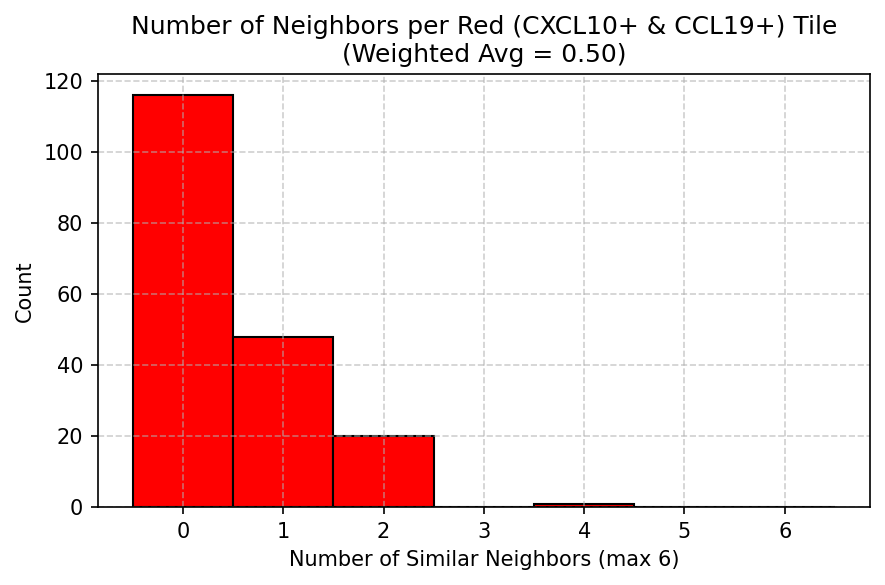


Pink (CXCL10+ only) tiles: 3797 / 29383 (12.92% of tiles with at least one cell)
Weighted average number of similar neighbors: 2.67


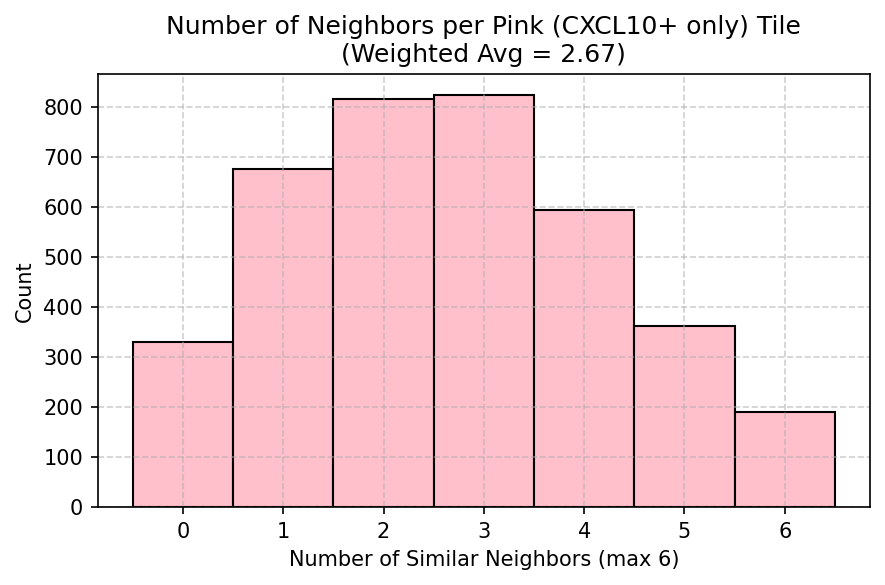


Brown (CCL19+ only) tiles: 552 / 29383 (1.88% of tiles with at least one cell)
Weighted average number of similar neighbors: 0.93


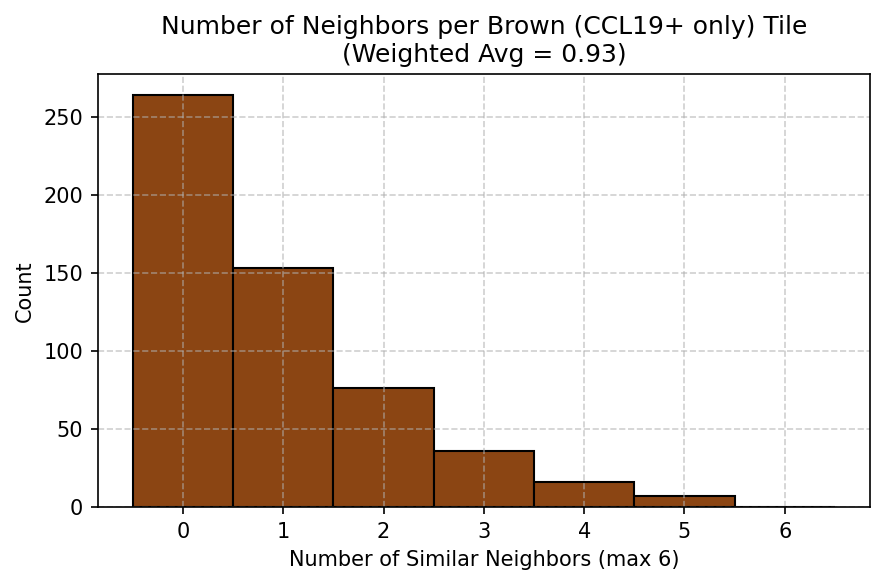

In [9]:
# Run neighborhood analysis for each tile type
analyze_tile_neighbors(hex_centers, tile_cxcl10_counts, tile_ccl19_counts, tile_counts, r, category='red')
analyze_tile_neighbors(hex_centers, tile_cxcl10_counts, tile_ccl19_counts, tile_counts, r, category='pink')
analyze_tile_neighbors(hex_centers, tile_cxcl10_counts, tile_ccl19_counts, tile_counts, r, category='brown')


# Heatmap based on local signal radar (cell based)

In [14]:
def compute_CXCL10_heatmap(DUPa_biopsy):
    # Step 1: Calculate cell centers
    df = DUPa_biopsy.copy()
    df['center_x'] = ((df['XMin'] + df['XMax']) / 2) * 0.5
    df['center_y'] = ((df['YMin'] + df['YMax']) / 2) * 0.5

    # Get arrays for fast computation
    coords = df[['center_x', 'center_y']].values
    cxcl10_pos = df[df['True_CXCL10'] == 1][['center_x', 'center_y']].values

    # Initialize CXCL10 scores
    scores = np.zeros(len(df))

    # Compute distances from every cell to all CXCL10+ cells
    for pos_x, pos_y in cxcl10_pos:
        dx = coords[:, 0] - pos_x
        dy = coords[:, 1] - pos_y
        distances = np.sqrt(dx**2 + dy**2)

        # Apply scoring rules
        scores += np.where(distances <= 25, 3,
                   np.where(distances <= 50, 2,
                   np.where(distances <= 75, 1, 0)))

    # Assign score to DataFrame
    df['CXCL10_score'] = scores

    # Plot heatmap using scatter (yellow to blue)
    plt.figure(figsize=(8, 6))
    scatter = plt.scatter(
        df['center_x'], df['center_y'],
        c=df['CXCL10_score'], cmap='YlGnBu',
        s=40, alpha=0.8
    )
    plt.gca().invert_yaxis()  # Optional if image-based
    plt.title("CXCL10 Score Heatmap")
    plt.xlabel("X Coordinate (µm)")
    plt.ylabel("Y Coordinate (µm)")
    plt.colorbar(scatter, label='CXCL10 Score')
    plt.show()
    weighted_score = (df['CXCL10_score'].sum()) / len(df)
    return weighted_score



In [16]:
def compute_CCL19_heatmap(DUPa_biopsy):
    # Step 1: Calculate cell centers
    df = DUPa_biopsy.copy()
    df['center_x'] = ((df['XMin'] + df['XMax']) / 2) * 0.5
    df['center_y'] = ((df['YMin'] + df['YMax']) / 2) * 0.5

    # Get arrays for fast computation
    coords = df[['center_x', 'center_y']].values
    ccl19_pos = df[df['True_CCL19'] == 1][['center_x', 'center_y']].values

    # Initialize CXCL10 scores
    scores = np.zeros(len(df))

    # Compute distances from every cell to all CXCL10+ cells
    for pos_x, pos_y in ccl19_pos:
        dx = coords[:, 0] - pos_x
        dy = coords[:, 1] - pos_y
        distances = np.sqrt(dx**2 + dy**2)

        # Apply scoring rules
        scores += np.where(distances <= 25, 3,
                   np.where(distances <= 50, 2,
                   np.where(distances <= 75, 1, 0)))

    # Assign score to DataFrame
    df['CCL19_score'] = scores

    # Plot heatmap using scatter (yellow to blue)
    plt.figure(figsize=(8, 6))
    scatter = plt.scatter(
        df['center_x'], df['center_y'],
        c=df['CCL19_score'], cmap='YlGnBu',
        s=40, alpha=0.8
    )
    plt.gca().invert_yaxis()  # Optional if image-based
    plt.title("CCL19 Score Heatmap")
    plt.xlabel("X Coordinate (µm)")
    plt.ylabel("Y Coordinate (µm)")
    plt.colorbar(scatter, label='CCL19 Score')
    plt.show()
    weighted_score = (df['CCL19_score'].sum()) / len(df)
    return weighted_score



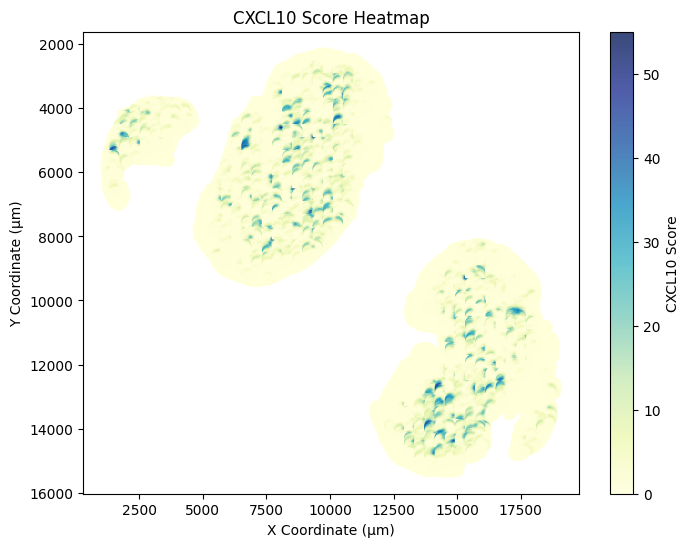

2.730102841432258

In [15]:
compute_CXCL10_heatmap(DUPa_biopsy_post_QC)

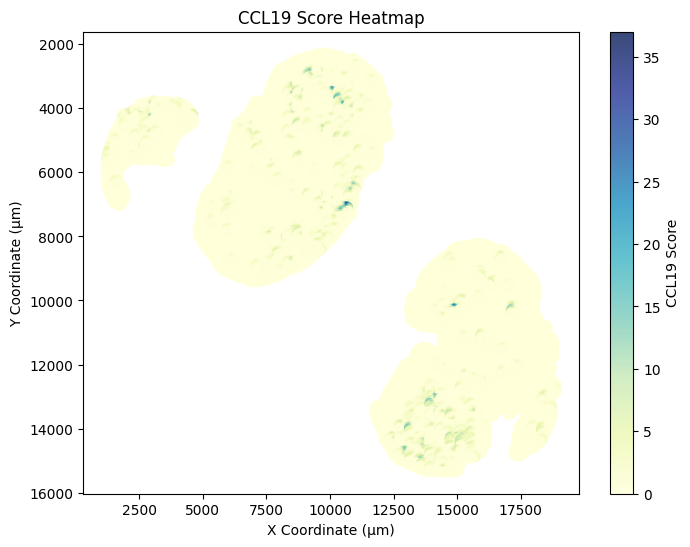

0.3978977810631703

In [17]:
compute_CCL19_heatmap(DUPa_biopsy_post_QC)

# Pilot for one dataframe

In [2]:
DUPa11_06_pilot = pd.read_csv('gs://fc-e9295d8f-5730-4967-b1ce-22c3d775d7c2/DUPa_ChromISH_CXCL10/DUPa11_06_analysis.csv', sep = ',')

In [3]:
print(DUPa11_06_pilot)

                                          Image Location Analysis Region  \
0      \\172.20.47.181\data\CTC_Lab\Polaris\2024-03(M...         Layer 1   
1      \\172.20.47.181\data\CTC_Lab\Polaris\2024-03(M...         Layer 1   
2      \\172.20.47.181\data\CTC_Lab\Polaris\2024-03(M...         Layer 1   
3      \\172.20.47.181\data\CTC_Lab\Polaris\2024-03(M...         Layer 1   
4      \\172.20.47.181\data\CTC_Lab\Polaris\2024-03(M...         Layer 1   
...                                                  ...             ...   
30888  \\172.20.47.181\data\CTC_Lab\Polaris\2024-03(M...         Layer 1   
30889  \\172.20.47.181\data\CTC_Lab\Polaris\2024-03(M...         Layer 1   
30890  \\172.20.47.181\data\CTC_Lab\Polaris\2024-03(M...         Layer 1   
30891  \\172.20.47.181\data\CTC_Lab\Polaris\2024-03(M...         Layer 1   
30892  \\172.20.47.181\data\CTC_Lab\Polaris\2024-03(M...         Layer 1   

               Algorithm Name  Object Id   XMin   XMax   YMin   YMax  \
0      DUPa11_0

In [4]:
DUPa11_06_pilot = DUPa11_06_pilot[DUPa11_06_pilot['Rejection Positive'] != 1]

print(len(DUPa11_06_pilot))

30679


Total number of hex tiles (full lattice): 60812
Number of hex tiles containing at least one cell: 6764
Number of hex tiles with at least one CXCL10+ cell: 176


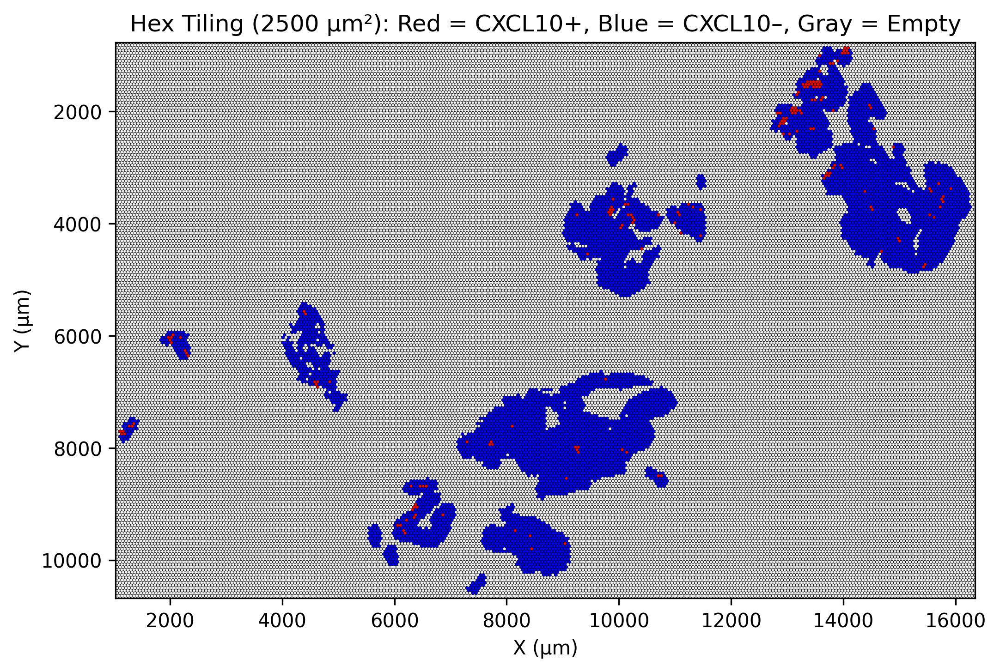

In [7]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.patches import RegularPolygon
from scipy.spatial import cKDTree

# Step 0: Preprocess the dataframe and convert pixels to micrometers
df = DUPa11_06_pilot[DUPa11_06_pilot['Rejection Positive'] != 1].copy()
df['center_x'] = ((df['XMin'] + df['XMax']) / 2) * 1/2 # convert to μm
df['center_y'] = ((df['YMin'] + df['YMax']) / 2) * 1/2 # convert to μm

x = df['center_x'].values
y = df['center_y'].values
cxcl10_positive = (df['CXCL10 Positive'] == 1).astype(int).values

# Step 1: Calculate hexagon radius for area = 2500 μm²
area = 2500
r = np.sqrt((2 * area) / (3 * np.sqrt(3)))  # ~17.1 μm

# Step 2: Define bounding box with padding
pad = 3 * r
x_min, x_max = x.min() - pad, x.max() + pad
y_min, y_max = y.min() - pad, y.max() + pad

# Step 3: Generate full blanket hexagonal grid
hex_width = np.sqrt(3) * r
hex_height = 2 * r
cols = int((x_max - x_min) / hex_width) + 2
rows = int((y_max - y_min) / (hex_height * 0.75)) + 2

hex_centers = []
for row in range(rows):
    for col in range(cols):
        x_offset = x_min + col * hex_width
        if row % 2 == 1:
            x_offset += hex_width / 2
        y_offset = y_min + row * hex_height * 0.75
        if x_offset <= x_max and y_offset <= y_max:
            hex_centers.append((x_offset, y_offset))

# Step 4: Assign each cell to its nearest hex center
tree = cKDTree(hex_centers)
distances, indices = tree.query(np.vstack([x, y]).T)

tile_counts = {}
tile_cxcl10_counts = {}

for idx, cxcl10 in zip(indices, cxcl10_positive):
    tile_counts[idx] = tile_counts.get(idx, 0) + 1
    tile_cxcl10_counts[idx] = tile_cxcl10_counts.get(idx, 0) + cxcl10

# Step 5: Plot the hexagons with correct color coding
fig, ax = plt.subplots(figsize=(8, 8), dpi=300)
for i, (hx, hy) in enumerate(hex_centers):
    if i in tile_cxcl10_counts:
        facecolor = 'red' if tile_cxcl10_counts[i] > 0 else 'blue'
    else:
        facecolor = '#f0f0f0'  # light gray for empty tiles
    
    hex_patch = RegularPolygon(
        (hx, hy), numVertices=6, radius=r, orientation=0,
        facecolor=facecolor, edgecolor='k', linewidth=0.2
    )
    ax.add_patch(hex_patch)

# Step 6: Print tile statistics
total_tiles = len(hex_centers)
tiles_with_cells = len(tile_counts)
tiles_with_cxcl10 = sum(1 for v in tile_cxcl10_counts.values() if v > 0)

print(f"Total number of hex tiles (full lattice): {total_tiles}")
print(f"Number of hex tiles containing at least one cell: {tiles_with_cells}")
print(f"Number of hex tiles with at least one CXCL10+ cell: {tiles_with_cxcl10}")

# Step 7: Finalize and save
ax.set_aspect('equal')
ax.set_xlim(x_min, x_max)
ax.set_ylim(y_min, y_max)
ax.invert_yaxis()
ax.set_xlabel("X (μm)")
ax.set_ylabel("Y (μm)")
ax.set_title("Hex Tiling (2500 μm²): Red = CXCL10+, Blue = CXCL10–, Gray = Empty")
plt.savefig('hexbin_cxcl10_red_blue_blanket.pdf', dpi=300, bbox_inches='tight')
plt.show()


In [10]:
area = 2500
r = np.sqrt((2 * area) / (3 * np.sqrt(3)))  # ~17.1 μm
print(r)

31.020161970069985


# 2 Pilot for CXCL10+, CCL19+ , DUPa7_2

In [4]:
DUPa07_02 = pd.read_csv('gs://fc-e9295d8f-5730-4967-b1ce-22c3d775d7c2/DUPa_ChromISH_CXCL10/DUPa07_02_analysis.csv', sep = ',')

In [6]:
print(len(DUPa07_02))

187722


Total number of hex tiles (full lattice): 126850
Number of hex tiles containing at least one cell: 48923
Number of hex tiles with CXCL10+ only: 3350
Number of hex tiles with CCL19+ only: 2500
Number of hex tiles with both CXCL10+ and CCL19+: 1208


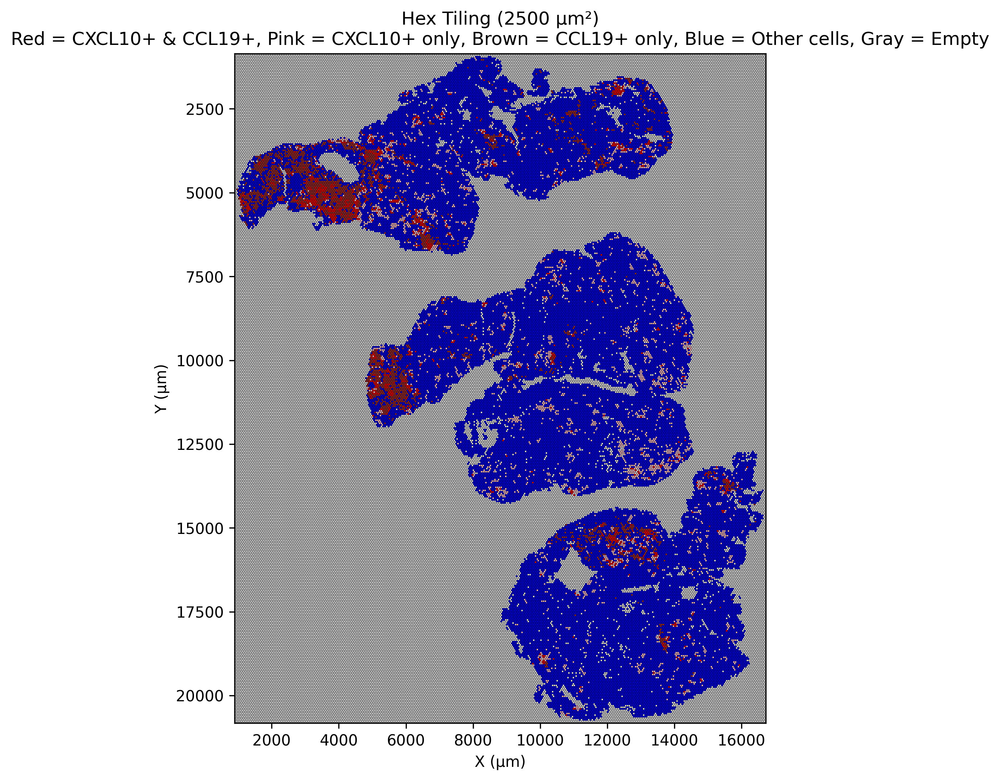

In [15]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.patches import RegularPolygon
from scipy.spatial import cKDTree

# Step 0: Preprocess the dataframe and convert pixels to micrometers
df = DUPa07_02[DUPa07_02['Rejection Positive'] != 1].copy()
df['center_x'] = ((df['XMin'] + df['XMax']) / 2) * 0.5  # convert to μm
df['center_y'] = ((df['YMin'] + df['YMax']) / 2) * 0.5  # convert to μm

x = df['center_x'].values
y = df['center_y'].values
cxcl10_positive = (df['CXCL10 Positive'] == 1).astype(int).values
ccl19_positive = (df['CCL19 Positive'] == 1).astype(int).values

# Step 1: Calculate hexagon radius for area = 2500 μm²
area = 2500
r = np.sqrt((2 * area) / (3 * np.sqrt(3)))  # ~17.1 μm

# Step 2: Define bounding box with padding
pad = 3 * r
x_min, x_max = x.min() - pad, x.max() + pad
y_min, y_max = y.min() - pad, y.max() + pad

# Step 3: Generate full blanket hexagonal grid
hex_width = np.sqrt(3) * r
hex_height = 2 * r
cols = int((x_max - x_min) / hex_width) + 2
rows = int((y_max - y_min) / (hex_height * 0.75)) + 2

hex_centers = []
for row in range(rows):
    for col in range(cols):
        x_offset = x_min + col * hex_width
        if row % 2 == 1:
            x_offset += hex_width / 2
        y_offset = y_min + row * hex_height * 0.75
        if x_offset <= x_max and y_offset <= y_max:
            hex_centers.append((x_offset, y_offset))

# Step 4: Assign each cell to its nearest hex center
tree = cKDTree(hex_centers)
distances, indices = tree.query(np.vstack([x, y]).T)

tile_counts = {}
tile_cxcl10_counts = {}
tile_ccl19_counts = {}

for idx, cxcl10, ccl19 in zip(indices, cxcl10_positive, ccl19_positive):
    tile_counts[idx] = tile_counts.get(idx, 0) + 1
    tile_cxcl10_counts[idx] = tile_cxcl10_counts.get(idx, 0) + cxcl10
    tile_ccl19_counts[idx] = tile_ccl19_counts.get(idx, 0) + ccl19

# Step 5: Plot the hexagons with correct color coding
fig, ax = plt.subplots(figsize=(8, 8), dpi=300)
for i, (hx, hy) in enumerate(hex_centers):
    cxcl10 = tile_cxcl10_counts.get(i, 0)
    ccl19 = tile_ccl19_counts.get(i, 0)
    count = tile_counts.get(i, 0)

    if count == 0:
        facecolor = '#f0f0f0'  # gray for empty tiles
    elif cxcl10 > 0 and ccl19 > 0:
        facecolor = 'red'
    elif cxcl10 > 0:
        facecolor = 'pink'
    elif ccl19 > 0:
        facecolor = 'brown'
    else:
        facecolor = 'blue'

    hex_patch = RegularPolygon(
        (hx, hy), numVertices=6, radius=r, orientation=0,
        facecolor=facecolor, edgecolor='k', linewidth=0.2
    )
    ax.add_patch(hex_patch)

# Step 6: Print tile statistics
total_tiles = len(hex_centers)
tiles_with_cells = len(tile_counts)
tiles_with_both = sum(1 for i in tile_counts if tile_cxcl10_counts.get(i, 0) > 0 and tile_ccl19_counts.get(i, 0) > 0)
tiles_cxcl10_only = sum(1 for i in tile_counts if tile_cxcl10_counts.get(i, 0) > 0 and tile_ccl19_counts.get(i, 0) == 0)
tiles_ccl19_only = sum(1 for i in tile_counts if tile_ccl19_counts.get(i, 0) > 0 and tile_cxcl10_counts.get(i, 0) == 0)

print(f"Total number of hex tiles (full lattice): {total_tiles}")
print(f"Number of hex tiles containing at least one cell: {tiles_with_cells}")
print(f"Number of hex tiles with CXCL10+ only: {tiles_cxcl10_only}")
print(f"Number of hex tiles with CCL19+ only: {tiles_ccl19_only}")
print(f"Number of hex tiles with both CXCL10+ and CCL19+: {tiles_with_both}")

# Step 7: Finalize and save
ax.set_aspect('equal')
ax.set_xlim(x_min, x_max)
ax.set_ylim(y_min, y_max)
ax.invert_yaxis()
ax.set_xlabel("X (μm)")
ax.set_ylabel("Y (μm)")
ax.set_title("Hex Tiling (2500 μm²)\nRed = CXCL10+ & CCL19+, Pink = CXCL10+ only, Brown = CCL19+ only, Blue = Other cells, Gray = Empty")
plt.savefig('hexbin_cxcl10_ccl19_blanket.pdf', dpi=300, bbox_inches='tight')
plt.show()


In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.patches import RegularPolygon
from scipy.spatial import cKDTree

# Step 0: Preprocess the dataframe and convert pixels to micrometers
df = DUPa07_02[DUPa07_02['Rejection Positive'] != 1].copy()
df['center_x'] = ((df['XMin'] + df['XMax']) / 2) * 0.5  # convert to μm
df['center_y'] = ((df['YMin'] + df['YMax']) / 2) * 0.5  # convert to μm

x = df['center_x'].values
y = df['center_y'].values
cxcl10_positive = (df['CXCL10 Positive'] == 1).astype(int).values
ccl19_positive = (df['CCL19 Positive'] == 1).astype(int).values

# Step 1: Calculate hexagon radius for area = 2500 μm²
area = 2500
r = np.sqrt((2 * area) / (3 * np.sqrt(3)))  # ~17.1 μm

# Step 2: Define bounding box with padding
pad = 3 * r
x_min, x_max = x.min() - pad, x.max() + pad
y_min, y_max = y.min() - pad, y.max() + pad

# Step 3: Generate full blanket hexagonal grid
hex_width = np.sqrt(3) * r
hex_height = 2 * r
cols = int((x_max - x_min) / hex_width) + 2
rows = int((y_max - y_min) / (hex_height * 0.75)) + 2

hex_centers = []
for row in range(rows):
    for col in range(cols):
        x_offset = x_min + col * hex_width
        if row % 2 == 1:
            x_offset += hex_width / 2
        y_offset = y_min + row * hex_height * 0.75
        if x_offset <= x_max and y_offset <= y_max:
            hex_centers.append((x_offset, y_offset))

# Step 4: Assign each cell to its nearest hex center
tree = cKDTree(hex_centers)
distances, indices = tree.query(np.vstack([x, y]).T)

tile_counts = {}
tile_cxcl10_counts = {}
tile_ccl19_counts = {}

for idx, cxcl10, ccl19 in zip(indices, cxcl10_positive, ccl19_positive):
    tile_counts[idx] = tile_counts.get(idx, 0) + 1
    tile_cxcl10_counts[idx] = tile_cxcl10_counts.get(idx, 0) + cxcl10
    tile_ccl19_counts[idx] = tile_ccl19_counts.get(idx, 0) + ccl19

# Step 5: Plot the hexagons with correct color coding
fig, ax = plt.subplots(figsize=(8, 8), dpi=300)
for i, (hx, hy) in enumerate(hex_centers):
    cxcl10 = tile_cxcl10_counts.get(i, 0)
    ccl19 = tile_ccl19_counts.get(i, 0)
    count = tile_counts.get(i, 0)

    if count == 0:
        facecolor = '#f0f0f0'  # gray for empty tiles
    elif cxcl10 > 0 and ccl19 > 0:
        facecolor = 'red'
    elif cxcl10 > 0:
        facecolor = 'pink'
    elif ccl19 > 0:
        facecolor = 'brown'
    else:
        facecolor = 'blue'

    hex_patch = RegularPolygon(
        (hx, hy), numVertices=6, radius=r, orientation=0,
        facecolor=facecolor, edgecolor='k', linewidth=0.2
    )
    ax.add_patch(hex_patch)

# Step 6: Print tile statistics
total_tiles = len(hex_centers)
tiles_with_cells = len(tile_counts)
tiles_with_both = sum(1 for i in tile_counts if tile_cxcl10_counts.get(i, 0) > 0 and tile_ccl19_counts.get(i, 0) > 0)
tiles_cxcl10_only = sum(1 for i in tile_counts if tile_cxcl10_counts.get(i, 0) > 0 and tile_ccl19_counts.get(i, 0) == 0)
tiles_ccl19_only = sum(1 for i in tile_counts if tile_ccl19_counts.get(i, 0) > 0 and tile_cxcl10_counts.get(i, 0) == 0)

print(f"Total number of hex tiles (full lattice): {total_tiles}")
print(f"Number of hex tiles containing at least one cell: {tiles_with_cells}")
print(f"Number of hex tiles with CXCL10+ only: {tiles_cxcl10_only}")
print(f"Number of hex tiles with CCL19+ only: {tiles_ccl19_only}")
print(f"Number of hex tiles with both CXCL10+ and CCL19+: {tiles_with_both}")

# Step 7: Finalize and save
ax.set_aspect('equal')
ax.set_xlim(x_min, x_max)
ax.set_ylim(y_min, y_max)
ax.invert_yaxis()
ax.set_xlabel("X (μm)")
ax.set_ylabel("Y (μm)")
ax.set_title("Hex Tiling (2500 μm²)\nRed = CXCL10+ & CCL19+, Pink = CXCL10+ only, Brown = CCL19+ only, Blue = Other cells, Gray = Empty")
plt.savefig('hexbin_cxcl10_ccl19_blanket.pdf', dpi=300, bbox_inches='tight')
plt.show()


Total number of hex tiles (full lattice): 126850
Number of hex tiles containing at least one cell: 48923
Number of hex tiles with CXCL10+ only: 3350
Number of hex tiles with CCL19+ only: 2500
Number of hex tiles with both CXCL10+ and CCL19+: 1208

Neighbor counts for RED tiles:
[0, 1, 1, 0, 1, 0, 1, 2, 1, 0, 0, 2, 3, 1, 1, 2, 4, 2, 0, 1, 1, 0, 0, 0, 5, 5, 3, 3, 2, 5, 6, 6, 5, 4, 2, 0, 1, 0, 0, 4, 6, 5, 5, 4, 1, 1, 1, 3, 3, 2, 0, 0, 0, 0, 0, 2, 0, 2, 2, 0, 2, 0, 2, 3, 3, 1, 0, 0, 1, 1, 0, 0, 1, 0, 1, 1, 1, 1, 2, 0, 1, 0, 0, 0, 1, 0, 2, 1, 0, 0, 1, 2, 0, 0, 0, 3, 3, 1, 0, 2, 0, 1, 1, 1, 3, 1, 0, 1, 1, 0, 1, 1, 1, 1, 2, 4, 3, 0, 1, 1, 1, 1, 1, 1, 0, 2, 2, 1, 0, 3, 0, 1, 2, 0, 3, 0, 1, 1, 0, 1, 0, 0, 4, 5, 3, 2, 0, 1, 3, 2, 0, 0, 1, 2, 2, 1, 2, 4, 3, 3, 1, 1, 0, 1, 3, 2, 2, 0, 3, 4, 1, 0, 0, 2, 3, 3, 2, 3, 1, 2, 3, 2, 1, 1, 0, 1, 0, 0, 0, 2, 1, 3, 3, 2, 2, 1, 3, 3, 2, 0, 2, 3, 2, 4, 4, 0, 1, 1, 3, 0, 2, 3, 4, 5, 5, 2, 2, 2, 2, 2, 4, 5, 3, 1, 0, 3, 4, 1, 4, 0, 1, 0, 1, 1, 0, 2, 2, 2, 2, 1, 

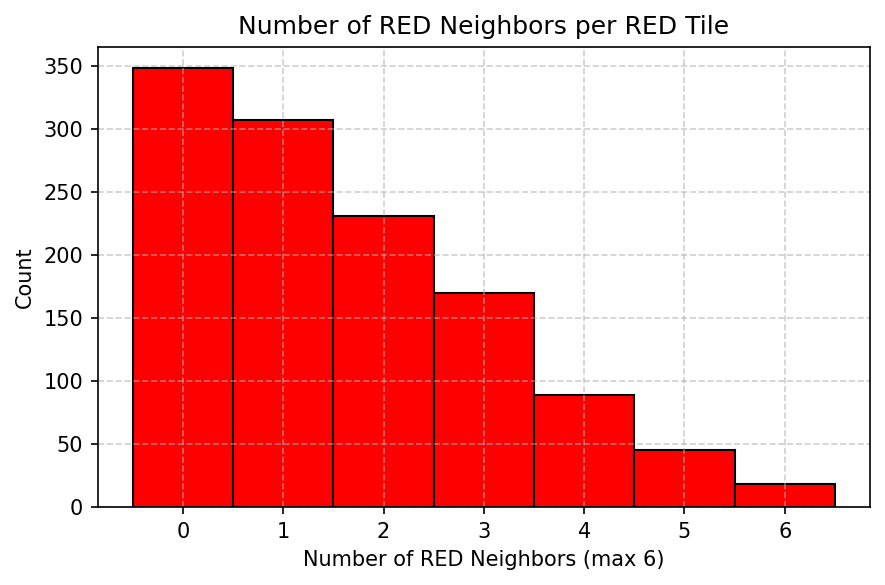


Neighbor counts for PINK tiles:
[1, 1, 2, 2, 2, 1, 2, 1, 0, 1, 1, 1, 1, 0, 0, 1, 0, 0, 1, 2, 2, 3, 1, 2, 3, 0, 0, 1, 1, 2, 3, 1, 2, 1, 2, 1, 1, 1, 0, 0, 1, 2, 1, 1, 1, 1, 0, 1, 2, 2, 0, 1, 2, 1, 0, 3, 0, 0, 0, 1, 0, 2, 2, 0, 0, 0, 2, 1, 0, 0, 1, 2, 2, 1, 0, 1, 1, 0, 0, 0, 0, 1, 1, 0, 0, 0, 1, 0, 0, 1, 0, 0, 0, 1, 1, 0, 2, 4, 2, 3, 3, 0, 0, 0, 1, 0, 0, 2, 1, 1, 1, 1, 1, 0, 0, 1, 0, 3, 2, 0, 0, 0, 0, 0, 2, 2, 0, 1, 1, 1, 2, 2, 2, 2, 0, 0, 1, 2, 3, 2, 1, 1, 3, 2, 2, 1, 0, 3, 0, 1, 1, 2, 2, 1, 1, 0, 1, 1, 1, 1, 0, 1, 0, 2, 1, 2, 1, 0, 0, 0, 2, 0, 3, 0, 1, 1, 0, 1, 2, 0, 0, 3, 3, 0, 0, 0, 0, 0, 1, 1, 1, 2, 1, 2, 3, 3, 1, 1, 2, 1, 1, 0, 0, 2, 2, 0, 2, 1, 1, 2, 0, 0, 0, 2, 1, 0, 1, 1, 4, 4, 4, 3, 1, 3, 2, 0, 2, 2, 1, 2, 2, 2, 2, 2, 2, 2, 1, 2, 0, 1, 2, 0, 2, 1, 0, 0, 2, 0, 2, 2, 1, 1, 2, 1, 0, 3, 3, 2, 3, 0, 1, 1, 3, 2, 1, 1, 1, 1, 0, 0, 4, 5, 1, 0, 0, 0, 2, 0, 1, 2, 1, 0, 0, 3, 4, 2, 1, 0, 1, 1, 0, 2, 3, 1, 0, 1, 2, 2, 1, 2, 2, 2, 1, 0, 3, 1, 1, 1, 3, 4, 2, 2, 1, 2, 0, 0, 2, 1, 0, 0, 0, 0, 

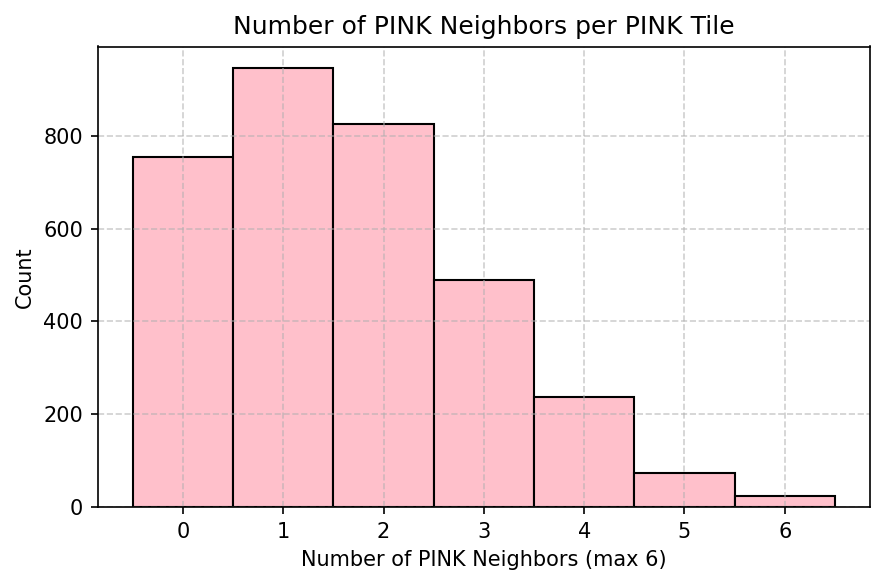


Neighbor counts for BROWN tiles:
[1, 1, 0, 0, 1, 1, 0, 1, 3, 3, 3, 4, 2, 0, 0, 2, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 2, 0, 3, 3, 1, 2, 1, 1, 0, 0, 1, 1, 0, 0, 1, 0, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 2, 2, 1, 2, 2, 2, 1, 1, 1, 2, 2, 0, 0, 2, 1, 3, 4, 4, 4, 2, 1, 2, 2, 0, 1, 4, 6, 5, 5, 5, 1, 1, 0, 0, 1, 1, 0, 4, 4, 4, 4, 2, 0, 2, 2, 0, 1, 1, 0, 0, 1, 0, 1, 0, 1, 1, 3, 2, 2, 0, 2, 3, 1, 2, 1, 0, 1, 3, 3, 1, 0, 1, 0, 2, 2, 0, 0, 1, 1, 0, 0, 1, 2, 1, 1, 2, 4, 4, 0, 1, 0, 1, 1, 3, 4, 2, 1, 0, 0, 0, 1, 1, 0, 0, 1, 2, 2, 2, 0, 0, 3, 5, 4, 4, 4, 5, 4, 2, 1, 2, 2, 0, 1, 0, 3, 3, 4, 5, 4, 2, 0, 0, 0, 1, 2, 1, 2, 3, 0, 3, 0, 1, 1, 0, 2, 1, 2, 2, 1, 2, 4, 3, 3, 2, 1, 1, 3, 4, 3, 1, 2, 0, 2, 1, 1, 1, 1, 1, 1, 3, 3, 2, 4, 3, 5, 5, 4, 2, 0, 0, 3, 3, 3, 3, 0, 0, 1, 0, 0, 0, 0, 1, 1, 1, 1, 0, 4, 5, 4, 5, 5, 5, 3, 4, 5, 5, 1, 1, 2, 0, 0, 0, 1, 1, 1, 0, 4, 5, 5, 5, 5, 4, 1, 2, 0, 4, 5, 3, 1, 3, 2, 2, 0, 1, 2, 0, 0, 3, 4, 4, 3, 4, 5, 3, 2, 2, 2, 0, 2, 2, 4, 3, 0, 3, 0, 1, 2, 4, 5, 4, 1, 0, 3, 1, 1, 1, 1,

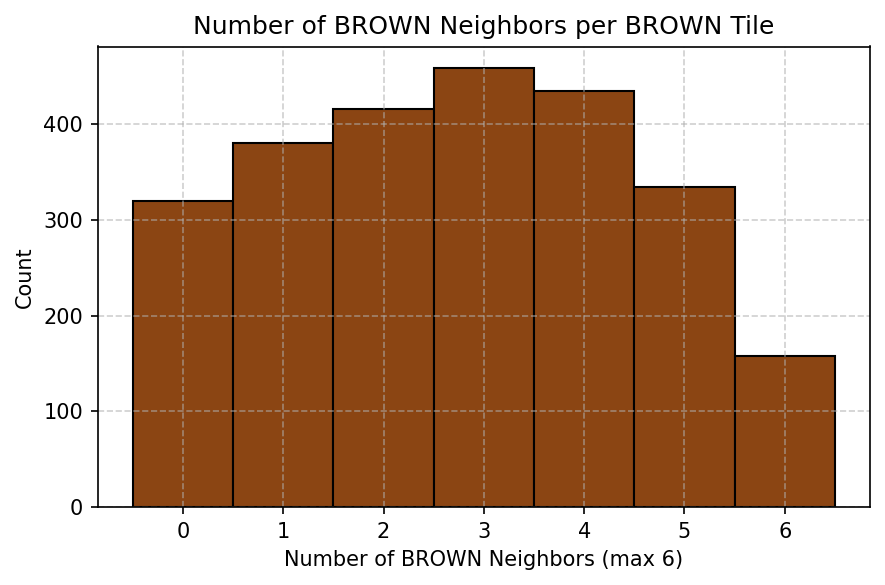

In [7]:
# Step 0: Preprocess the dataframe and convert pixels to micrometers
df = DUPa07_02[DUPa07_02['Rejection Positive'] != 1].copy()
df['center_x'] = ((df['XMin'] + df['XMax']) / 2) * 0.5  # convert to μm
df['center_y'] = ((df['YMin'] + df['YMax']) / 2) * 0.5  # convert to μm

x = df['center_x'].values
y = df['center_y'].values
cxcl10_positive = (df['CXCL10 Positive'] == 1).astype(int).values
ccl19_positive = (df['CCL19 Positive'] == 1).astype(int).values

# Step 1: Calculate hexagon radius for area = 2500 μm²
area = 2500
r = np.sqrt((2 * area) / (3 * np.sqrt(3)))  # ~17.1 μm

# Step 2: Define bounding box with padding
pad = 3 * r
x_min, x_max = x.min() - pad, x.max() + pad
y_min, y_max = y.min() - pad, y.max() + pad

# Step 3: Generate full blanket hexagonal grid
hex_width = np.sqrt(3) * r
hex_height = 2 * r
cols = int((x_max - x_min) / hex_width) + 2
rows = int((y_max - y_min) / (hex_height * 0.75)) + 2

hex_centers = []
for row in range(rows):
    for col in range(cols):
        x_offset = x_min + col * hex_width
        if row % 2 == 1:
            x_offset += hex_width / 2
        y_offset = y_min + row * hex_height * 0.75
        if x_offset <= x_max and y_offset <= y_max:
            hex_centers.append((x_offset, y_offset))

# Step 4: Assign each cell to its nearest hex center
tree = cKDTree(hex_centers)
distances, indices = tree.query(np.vstack([x, y]).T)

tile_counts = {}
tile_cxcl10_counts = {}
tile_ccl19_counts = {}

for idx, cxcl10, ccl19 in zip(indices, cxcl10_positive, ccl19_positive):
    tile_counts[idx] = tile_counts.get(idx, 0) + 1
    tile_cxcl10_counts[idx] = tile_cxcl10_counts.get(idx, 0) + cxcl10
    tile_ccl19_counts[idx] = tile_ccl19_counts.get(idx, 0) + ccl19

# Step 5: Print summary stats
total_tiles = len(hex_centers)
tiles_with_cells = len(tile_counts)
tiles_with_both = sum(1 for i in tile_counts if tile_cxcl10_counts.get(i, 0) > 0 and tile_ccl19_counts.get(i, 0) > 0)
tiles_cxcl10_only = sum(1 for i in tile_counts if tile_cxcl10_counts.get(i, 0) > 0 and tile_ccl19_counts.get(i, 0) == 0)
tiles_ccl19_only = sum(1 for i in tile_counts if tile_ccl19_counts.get(i, 0) > 0 and tile_cxcl10_counts.get(i, 0) == 0)

print(f"Total number of hex tiles (full lattice): {total_tiles}")
print(f"Number of hex tiles containing at least one cell: {tiles_with_cells}")
print(f"Number of hex tiles with CXCL10+ only: {tiles_cxcl10_only}")
print(f"Number of hex tiles with CCL19+ only: {tiles_ccl19_only}")
print(f"Number of hex tiles with both CXCL10+ and CCL19+: {tiles_with_both}")


# Step 6: Analyze tile neighbors by color category
def analyze_tile_neighbors(hex_centers, tile_cxcl10_counts, tile_ccl19_counts, r, category='red'):
    # Define index selection logic
    if category == 'red':
        indices = [
            i for i in range(len(hex_centers))
            if tile_cxcl10_counts.get(i, 0) > 0 and tile_ccl19_counts.get(i, 0) > 0
        ]
        is_target = lambda i: tile_cxcl10_counts.get(i, 0) > 0 and tile_ccl19_counts.get(i, 0) > 0
        color = 'red'
    elif category == 'pink':
        indices = [
            i for i in range(len(hex_centers))
            if tile_cxcl10_counts.get(i, 0) > 0 and tile_ccl19_counts.get(i, 0) == 0
        ]
        is_target = lambda i: tile_cxcl10_counts.get(i, 0) > 0 and tile_ccl19_counts.get(i, 0) == 0
        color = 'pink'
    elif category == 'brown':
        indices = [
            i for i in range(len(hex_centers))
            if tile_ccl19_counts.get(i, 0) > 0 and tile_cxcl10_counts.get(i, 0) == 0
        ]
        is_target = lambda i: tile_ccl19_counts.get(i, 0) > 0 and tile_cxcl10_counts.get(i, 0) == 0
        color = 'saddlebrown'
    else:
        raise ValueError("Invalid category")

    tree = cKDTree(hex_centers)
    neighbor_counts = []

    for idx in indices:
        center = hex_centers[idx]
        neighbors = tree.query_ball_point(center, r * 2)
        neighbors = [n for n in neighbors if n != idx]
        count = sum(is_target(n) for n in neighbors)
        neighbor_counts.append(count)

    print(f"\nNeighbor counts for {category.upper()} tiles:")
    print(neighbor_counts)

    plt.figure(figsize=(6, 4), dpi=150)
    plt.hist(neighbor_counts, bins=np.arange(-0.5, 7.5, 1), color=color, edgecolor='black')
    plt.title(f"Number of {category.upper()} Neighbors per {category.upper()} Tile")
    plt.xlabel(f"Number of {category.upper()} Neighbors (max 6)")
    plt.ylabel("Count")
    plt.xticks(range(7))
    plt.grid(True, linestyle='--', alpha=0.6)
    plt.tight_layout()
    plt.savefig(f"{category}_tile_neighbor_histogram.pdf", bbox_inches="tight")
    plt.show()

# Step 7: Run analyses
analyze_tile_neighbors(hex_centers, tile_cxcl10_counts, tile_ccl19_counts, r, category='red')
analyze_tile_neighbors(hex_centers, tile_cxcl10_counts, tile_ccl19_counts, r, category='pink')
analyze_tile_neighbors(hex_centers, tile_cxcl10_counts, tile_ccl19_counts, r, category='brown')


Red (CXCL10+ & CCL19+) tiles: 1208 / 48923 (2.47% of tiles with at least one cell)
Neighbor counts for Red (CXCL10+ & CCL19+) tiles:
[0, 0, 1, 1, 1, 0, 1, 1, 1, 0, 1, 1, 0, 0, 0, 0, 0, 0, 1, 1, 0, 2, 2, 1, 2, 1, 1, 3, 2, 2, 4, 3, 5, 3, 5, 2, 4, 5, 6, 5, 6, 6, 5, 5, 4, 4, 2, 3, 3, 0, 0, 0, 0, 0, 0, 2, 3, 2, 1, 3, 1, 1, 0, 2, 2, 2, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 2, 0, 0, 1, 2, 1, 0, 2, 3, 0, 0, 0, 0, 1, 1, 0, 0, 0, 0, 0, 1, 1, 1, 1, 0, 2, 1, 2, 0, 1, 1, 1, 2, 1, 2, 2, 2, 3, 0, 1, 1, 3, 4, 3, 0, 3, 1, 2, 3, 1, 1, 0, 3, 0, 1, 1, 0, 0, 3, 2, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 0, 0, 2, 5, 3, 0, 4, 2, 3, 3, 2, 4, 1, 3, 4, 2, 0, 3, 2, 1, 3, 2, 1, 3, 0, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 2, 0, 2, 3, 1, 4, 0, 2, 3, 1, 3, 2, 3, 4, 4, 2, 5, 2, 4, 5, 2, 3, 4, 3, 5, 4, 2, 2, 1, 1, 2, 3, 2, 0, 1, 1, 2, 1, 1, 0, 0, 1, 1, 2, 1, 2, 1, 0, 0, 3, 1, 1, 2, 3, 2, 2, 1, 1, 1, 1, 3, 1, 1, 1, 1, 0, 0, 0, 1, 2, 1, 0, 0, 1, 1, 1, 1, 0, 0, 0, 0, 1, 1, 0, 0, 2, 3, 0, 2, 2, 0, 0, 0, 1, 2, 1, 1, 2, 1

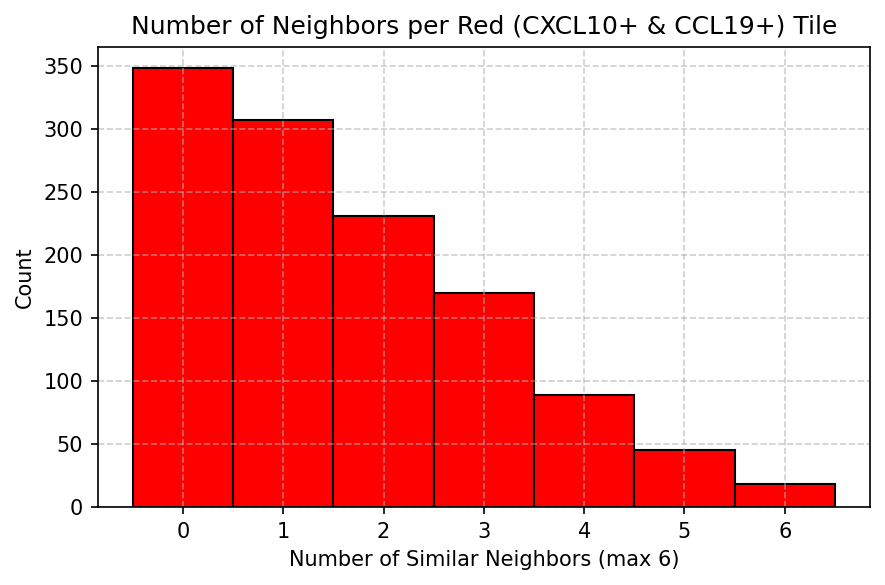


Pink (CXCL10+ only) tiles: 3350 / 48923 (6.85% of tiles with at least one cell)
Neighbor counts for Pink (CXCL10+ only) tiles:
[1, 1, 1, 2, 2, 2, 1, 2, 1, 0, 0, 1, 1, 1, 1, 2, 0, 1, 0, 0, 1, 1, 1, 3, 2, 2, 0, 0, 0, 0, 0, 1, 2, 1, 0, 0, 1, 0, 2, 3, 1, 2, 1, 1, 1, 0, 1, 3, 1, 1, 0, 2, 2, 2, 1, 1, 0, 0, 0, 1, 2, 2, 3, 2, 2, 1, 0, 1, 0, 0, 0, 0, 0, 1, 0, 1, 1, 1, 0, 0, 1, 1, 0, 0, 0, 2, 4, 2, 0, 2, 2, 1, 0, 1, 0, 0, 0, 1, 1, 1, 1, 1, 1, 0, 1, 2, 2, 0, 0, 1, 3, 0, 0, 0, 1, 2, 1, 2, 0, 2, 1, 1, 0, 0, 3, 3, 0, 0, 2, 2, 2, 0, 0, 0, 0, 0, 1, 1, 0, 1, 2, 1, 1, 1, 1, 0, 0, 1, 2, 3, 2, 2, 3, 2, 3, 2, 2, 1, 3, 3, 3, 0, 2, 0, 1, 1, 0, 1, 2, 1, 1, 0, 1, 1, 1, 0, 0, 1, 0, 0, 0, 0, 1, 1, 0, 1, 0, 2, 2, 1, 0, 0, 2, 1, 0, 1, 1, 1, 2, 2, 1, 1, 1, 2, 0, 2, 4, 1, 1, 2, 2, 2, 2, 2, 2, 1, 0, 0, 2, 4, 4, 3, 2, 1, 1, 0, 0, 0, 0, 1, 2, 2, 3, 3, 1, 1, 2, 2, 1, 0, 1, 2, 3, 3, 3, 0, 4, 5, 0, 4, 2, 3, 2, 2, 2, 1, 2, 1, 2, 1, 1, 0, 0, 3, 2, 0, 2, 0, 1, 0, 2, 0, 0, 1, 0, 0, 2, 2, 2, 1, 1, 0, 1, 2, 1, 1, 1, 0, 0, 0, 0

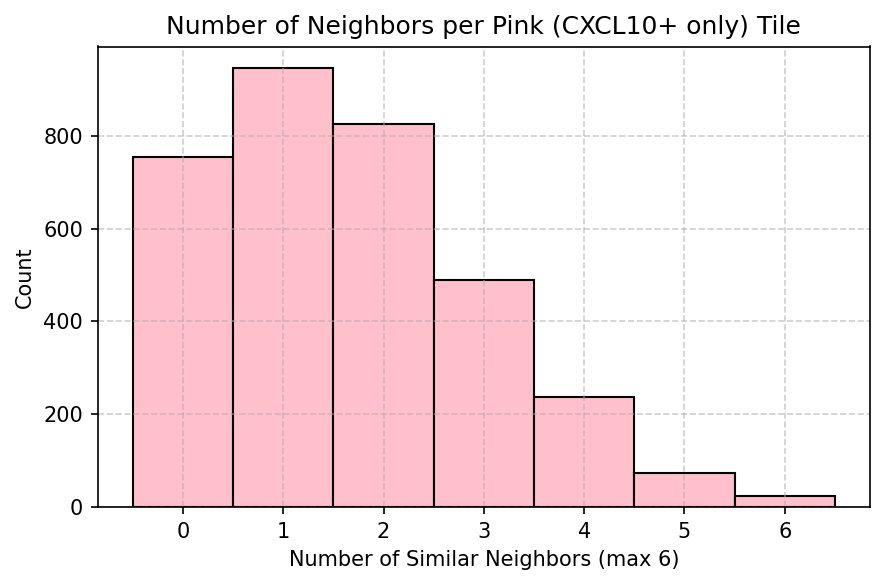


Brown (CCL19+ only) tiles: 2500 / 48923 (5.11% of tiles with at least one cell)
Neighbor counts for Brown (CCL19+ only) tiles:
[0, 1, 1, 0, 1, 1, 0, 3, 3, 1, 3, 4, 2, 2, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 0, 0, 0, 1, 1, 1, 1, 1, 1, 0, 0, 0, 2, 3, 3, 2, 1, 1, 0, 1, 1, 2, 2, 2, 1, 1, 1, 2, 2, 2, 1, 1, 0, 0, 1, 1, 1, 2, 0, 0, 1, 1, 0, 1, 1, 0, 0, 1, 0, 1, 0, 1, 3, 1, 3, 4, 6, 4, 1, 4, 2, 1, 1, 2, 2, 0, 4, 2, 4, 1, 5, 5, 5, 4, 4, 2, 4, 2, 0, 0, 2, 2, 1, 1, 0, 2, 2, 0, 1, 0, 0, 1, 1, 0, 3, 2, 3, 3, 1, 0, 0, 0, 2, 2, 2, 0, 1, 0, 0, 1, 2, 0, 1, 1, 0, 0, 2, 0, 1, 0, 0, 1, 1, 1, 2, 0, 2, 0, 1, 1, 4, 2, 1, 4, 3, 4, 0, 1, 1, 1, 2, 0, 0, 0, 1, 1, 2, 1, 1, 1, 1, 1, 0, 3, 1, 2, 3, 3, 1, 1, 1, 1, 1, 0, 0, 0, 2, 0, 3, 3, 4, 4, 2, 5, 5, 4, 2, 3, 5, 5, 4, 4, 5, 5, 5, 4, 4, 5, 5, 5, 4, 4, 3, 5, 0, 0, 2, 1, 3, 0, 0, 4, 4, 3, 5, 3, 3, 2, 1, 3, 3, 3, 0, 1, 5, 4, 4, 2, 4, 5, 4, 3, 2, 2, 1, 2, 3, 3, 5, 5, 4, 1, 4, 5, 1, 3, 2, 2, 2, 1, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 2, 3, 1, 2, 3, 4, 2, 0, 1, 2, 3, 0, 0, 1, 0, 1, 0

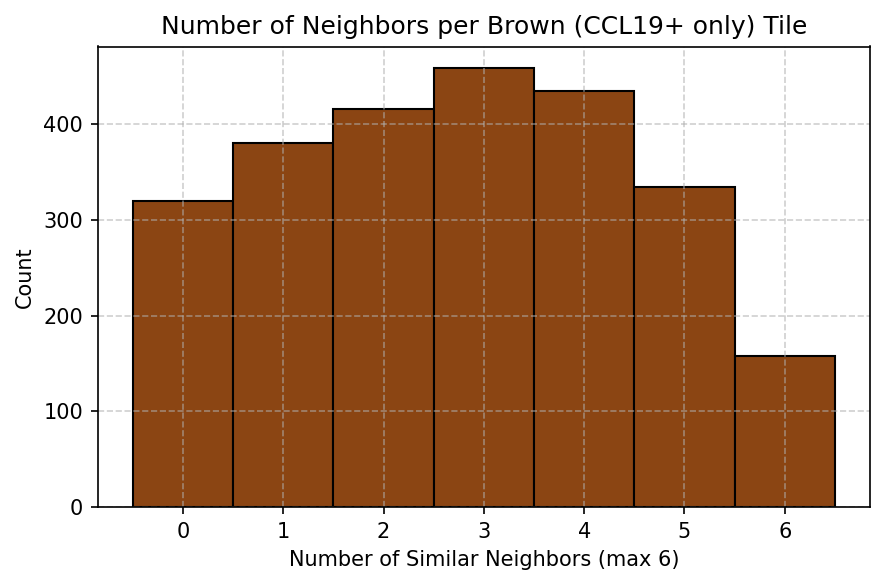

In [9]:
def analyze_tile_neighbors(hex_centers, tile_cxcl10_counts, tile_ccl19_counts, tile_counts, r, category='red'):
    total_with_cells = len(tile_counts)

    if category == 'red':
        indices = [
            i for i in tile_counts
            if tile_cxcl10_counts.get(i, 0) > 0 and tile_ccl19_counts.get(i, 0) > 0
        ]
        is_target = lambda i: tile_cxcl10_counts.get(i, 0) > 0 and tile_ccl19_counts.get(i, 0) > 0
        label = 'Red (CXCL10+ & CCL19+)'
        color = 'red'
    elif category == 'pink':
        indices = [
            i for i in tile_counts
            if tile_cxcl10_counts.get(i, 0) > 0 and tile_ccl19_counts.get(i, 0) == 0
        ]
        is_target = lambda i: tile_cxcl10_counts.get(i, 0) > 0 and tile_ccl19_counts.get(i, 0) == 0
        label = 'Pink (CXCL10+ only)'
        color = 'pink'
    elif category == 'brown':
        indices = [
            i for i in tile_counts
            if tile_ccl19_counts.get(i, 0) > 0 and tile_cxcl10_counts.get(i, 0) == 0
        ]
        is_target = lambda i: tile_ccl19_counts.get(i, 0) > 0 and tile_cxcl10_counts.get(i, 0) == 0
        label = 'Brown (CCL19+ only)'
        color = 'saddlebrown'
    else:
        raise ValueError("Invalid category")

    count_tiles = len(indices)
    fraction = count_tiles / total_with_cells if total_with_cells > 0 else 0

    print(f"\n{label} tiles: {count_tiles} / {total_with_cells} "
          f"({fraction:.2%} of tiles with at least one cell)")

    # Neighbor count analysis
    tree = cKDTree(hex_centers)
    neighbor_counts = []

    for idx in indices:
        center = hex_centers[idx]
        neighbors = tree.query_ball_point(center, r * 2)
        neighbors = [n for n in neighbors if n != idx]
        count = sum(is_target(n) for n in neighbors)
        neighbor_counts.append(count)

    print(f"Neighbor counts for {label} tiles:")
    print(neighbor_counts)

    plt.figure(figsize=(6, 4), dpi=150)
    plt.hist(neighbor_counts, bins=np.arange(-0.5, 7.5, 1), color=color, edgecolor='black')
    plt.title(f"Number of Neighbors per {label} Tile")
    plt.xlabel("Number of Similar Neighbors (max 6)")
    plt.ylabel("Count")
    plt.xticks(range(7))
    plt.grid(True, linestyle='--', alpha=0.6)
    plt.tight_layout()
    plt.savefig(f"{category}_tile_neighbor_histogram.pdf", bbox_inches="tight")
    plt.show()

analyze_tile_neighbors(hex_centers, tile_cxcl10_counts, tile_ccl19_counts, tile_counts, r, category='red')
analyze_tile_neighbors(hex_centers, tile_cxcl10_counts, tile_ccl19_counts, tile_counts, r, category='pink')
analyze_tile_neighbors(hex_centers, tile_cxcl10_counts, tile_ccl19_counts, tile_counts, r, category='brown')


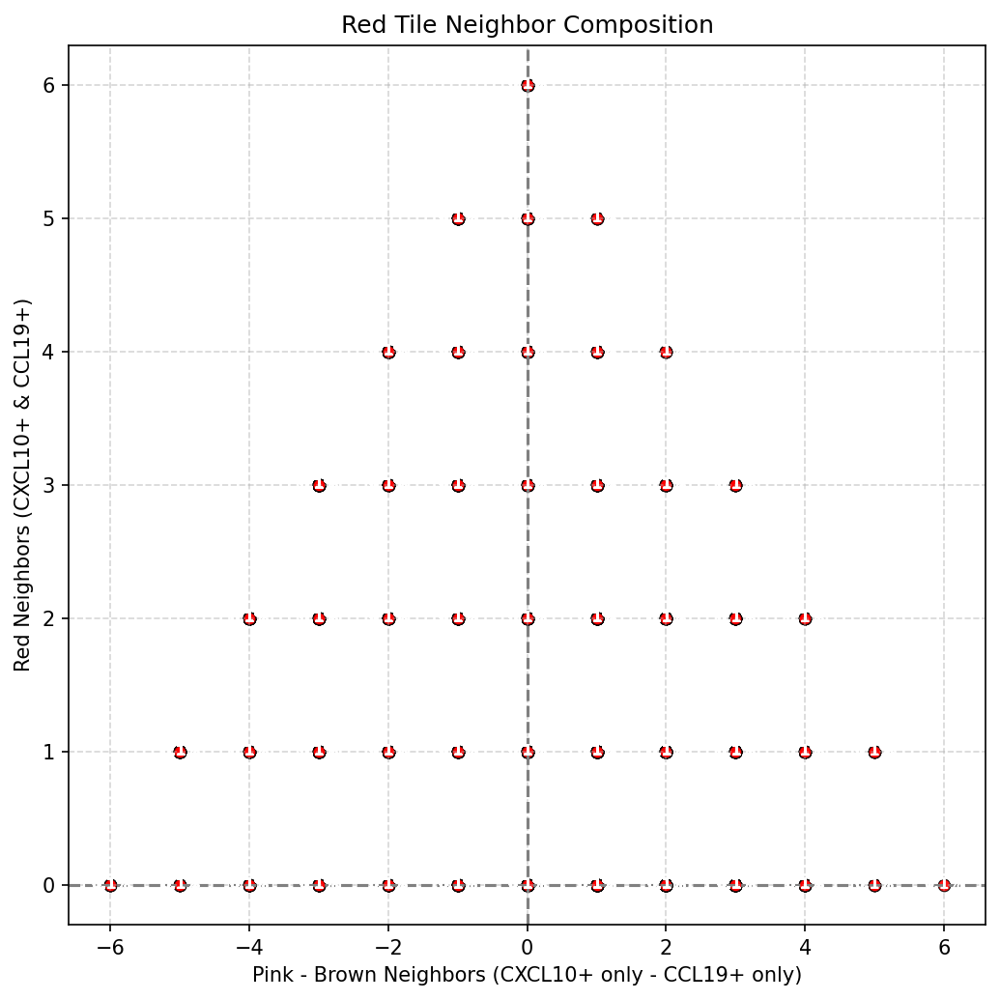

In [13]:
import pandas as pd
from scipy.spatial import cKDTree

def get_red_tile_neighbor_composition_df(hex_centers, tile_cxcl10_counts, tile_ccl19_counts, tile_counts, r):
    red_indices = [
        i for i in tile_counts
        if tile_cxcl10_counts.get(i, 0) > 0 and tile_ccl19_counts.get(i, 0) > 0
    ]

    tree = cKDTree(hex_centers)

    data = []
    total_red = len(red_indices)

    for idx in red_indices:
        center = hex_centers[idx]
        neighbors = tree.query_ball_point(center, r * 2)
        neighbors = [n for n in neighbors if n != idx]

        red_count = 0
        pink_count = 0
        brown_count = 0

        for n in neighbors:
            cxcl10 = tile_cxcl10_counts.get(n, 0)
            ccl19 = tile_ccl19_counts.get(n, 0)

            if cxcl10 > 0 and ccl19 > 0:
                red_count += 1
            elif cxcl10 > 0 and ccl19 == 0:
                pink_count += 1
            elif ccl19 > 0 and cxcl10 == 0:
                brown_count += 1

        data.append({
            'tile_index': idx,
            'x_coord': center[0],
            'y_coord': center[1],
            'red_neighbors': red_count,
            'pink_neighbors': pink_count,
            'brown_neighbors': brown_count,
            'pink_minus_brown': pink_count - brown_count,
            'percent_of_total_red': 100 / total_red
        })

    df = pd.DataFrame(data)
    return df


plot_red_tile_neighbor_composition(hex_centers, tile_cxcl10_counts, tile_ccl19_counts, tile_counts, r)


In [16]:
red_tile_df = get_red_tile_neighbor_composition_df(
    hex_centers, tile_cxcl10_counts, tile_ccl19_counts, tile_counts, r
)

print(red_tile_df)


      tile_index       x_coord       y_coord  red_neighbors  pink_neighbors  \
0           2500   8412.179037   1227.431458              0               0   
1           5153   8331.586292   1646.203644              0               0   
2           4934  12388.087785   1599.673401              1               1   
3           4933  12334.359288   1599.673401              1               0   
4           7471   6074.989435   2018.445588              1               1   
...          ...           ...           ...            ...             ...   
1203      120904  14295.449414  19886.058883              0               3   
1204      124088  10991.146873  20397.891555              1               1   
1205      124089  11044.875370  20397.891555              1               3   
1206      124092  11206.060860  20397.891555              0               1   
1207      125264  10776.232887  20584.012527              0               2   

      brown_neighbors  pink_minus_brown  percent_of